In [1]:
import nltk
from nltk import *
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.linear_model import LogisticRegression
import csv
import pickle
import pandas as pd
from sklearn.svm import LinearSVC
from nltk.classify.scikitlearn import SklearnClassifier # A wrapper to include the scikit learn algorithms within the nltk classifier
import matplotlib.pyplot as plt
import random

In [2]:
from sklearn.metrics import confusion_matrix 
import numpy as np
import itertools

**Tokenize the data**

In [3]:
def remove_punctuation(word):
    no_punct = ""
    for char in word:
        if char not in string.punctuation:
            no_punct = no_punct + char
    if no_punct.isnumeric():
        return ''
    return no_punct

In [4]:
''.isnumeric()

False

In [5]:
remove_punctuation(".")

''

In [6]:
ps = PorterStemmer()
def stem_the_word(word):
    word.encode('utf-8')
    return ps.stem(word)

In [7]:
stem_the_word("running")

'run'

In [8]:
def tokenize_the_training_data(data):
    tokenized_training_data = []
    for each in data:
        sentiment = each.strip().split(',')[0]
        text = str(each.strip().split(',')[1:])
        tokenized_training_data.append((word_tokenize(text), sentiment))
    return tokenized_training_data

In [9]:
stop_words = stopwords.words('english')
def filter_words(tokenized_data):
    filtered_data = []
    for (tokenized_words, sentiment) in tokenized_data:
        filtered_data.append(([stem_the_word(remove_punctuation(word.lower())) for word in tokenized_words if remove_punctuation(word.lower()) not in stop_words and remove_punctuation(word.lower()) != ''], sentiment))
    return filtered_data

In [10]:
# reading data from reviews.txt
with open("data/Reviews.txt") as file:
    data = file.readlines()
#print(data)

tokenized_training_data = tokenize_the_training_data(data)
#print(tokenized_training_data)
filtered_training_data = filter_words(tokenized_training_data)
print(filtered_training_data)


[(['nt', 'use', 'facebook', 'messeng', 'often', 'alway', 'reliabl'], '1'), (['phone', 'featur', 'nt', 'work', 'sometim', 'app', 'freez'], '0'), (['kind', 'pest', 'like', 'interrupt', 'someth', 'els'], '0'), (['envas', 'privaci', 'thing', 'comput', 'phone'], '0'), (['want', 'say', 'thank', 'help', 'heather', 'geronimo', 'wonder', 'help'], '1'), (['easi', 'use', 'like', 'notif', 'receiv', 'fb', 'messeng', 'call'], '1'), (['could', 'give', 'zero', 'star', 'forc', 'close', 'u', 'wan', 'na', 'video', 'chat'], '0'), (['great', 'app', 'littl', 'slow', 'come', 'kindl', 'fire'], '0'), (['fb', 'messeng', 'allow', 'avoid', 'work', 'keep', 'contact', 'friend'], '1'), (['like', 'fact', 'messeng', 'app', 'chat', 'fb'], '0'), (['luv', 'much', 'easier', 'text'], '1'), (['love', 'great', 'way', 'stay', 'touch'], '1'), (['fast', 'accur', 'love'], '1'), (['bosch', 'great', 'season', 'compani'], '1'), (['great', 'eaizier', 'talk', 'peopl'], '1'), (['love', 'way', 'give', 'notic'], '1'), (['think', 'improv

In [11]:
def find_words_in_data(filtered_training_data):
    all_words = []
    for (words, sentiment) in filtered_training_data:
        if words != "":
          all_words += words
    return all_words

In [12]:
len(find_words_in_data(filtered_training_data))

39216

In [13]:
def find_word_count(words):
    words = FreqDist(words)
    print(words)
    word_features = [w for (w, c) in words.most_common(1000)]
    return word_features

In [14]:
word_features = find_word_count(find_words_in_data(filtered_training_data))

<FreqDist with 3027 samples and 39216 outcomes>


In [15]:
#word_features_set = set(word_features)
word_features_set = find_words_in_data(filtered_training_data)

In [16]:
len(word_features_set)

39216

In [17]:
def find_features(each_review_words):
    global all_words_in_data
    features = {}
    words = set(each_review_words)
    for each_word in word_features_set:
        #features[each_word] = (each_word in words)
        if each_word in words:
            features[each_word] = 1
        else:
            features[each_word] = 0
    return features

In [18]:
final_filtered_data = [(find_features(words), sentiment) for (words,sentiment) in filtered_training_data]

In [19]:
final_filtered_data[0]

({'nt': 1,
  'use': 1,
  'facebook': 1,
  'messeng': 1,
  'often': 1,
  'alway': 1,
  'reliabl': 1,
  'phone': 0,
  'featur': 0,
  'work': 0,
  'sometim': 0,
  'app': 0,
  'freez': 0,
  'kind': 0,
  'pest': 0,
  'like': 0,
  'interrupt': 0,
  'someth': 0,
  'els': 0,
  'envas': 0,
  'privaci': 0,
  'thing': 0,
  'comput': 0,
  'want': 0,
  'say': 0,
  'thank': 0,
  'help': 0,
  'heather': 0,
  'geronimo': 0,
  'wonder': 0,
  'easi': 0,
  'notif': 0,
  'receiv': 0,
  'fb': 0,
  'call': 0,
  'could': 0,
  'give': 0,
  'zero': 0,
  'star': 0,
  'forc': 0,
  'close': 0,
  'u': 0,
  'wan': 0,
  'na': 0,
  'video': 0,
  'chat': 0,
  'great': 0,
  'littl': 0,
  'slow': 0,
  'come': 0,
  'kindl': 0,
  'fire': 0,
  'allow': 0,
  'avoid': 0,
  'keep': 0,
  'contact': 0,
  'friend': 0,
  'fact': 0,
  'luv': 0,
  'much': 0,
  'easier': 0,
  'text': 0,
  'love': 0,
  'way': 0,
  'stay': 0,
  'touch': 0,
  'fast': 0,
  'accur': 0,
  'bosch': 0,
  'season': 0,
  'compani': 0,
  'eaizier': 0,
  'talk'

In [20]:
len(final_filtered_data)

5313

In [21]:
print(word_features_set)

['nt', 'use', 'facebook', 'messeng', 'often', 'alway', 'reliabl', 'phone', 'featur', 'nt', 'work', 'sometim', 'app', 'freez', 'kind', 'pest', 'like', 'interrupt', 'someth', 'els', 'envas', 'privaci', 'thing', 'comput', 'phone', 'want', 'say', 'thank', 'help', 'heather', 'geronimo', 'wonder', 'help', 'easi', 'use', 'like', 'notif', 'receiv', 'fb', 'messeng', 'call', 'could', 'give', 'zero', 'star', 'forc', 'close', 'u', 'wan', 'na', 'video', 'chat', 'great', 'app', 'littl', 'slow', 'come', 'kindl', 'fire', 'fb', 'messeng', 'allow', 'avoid', 'work', 'keep', 'contact', 'friend', 'like', 'fact', 'messeng', 'app', 'chat', 'fb', 'luv', 'much', 'easier', 'text', 'love', 'great', 'way', 'stay', 'touch', 'fast', 'accur', 'love', 'bosch', 'great', 'season', 'compani', 'great', 'eaizier', 'talk', 'peopl', 'love', 'way', 'give', 'notic', 'think', 'improv', 'best', 'thing', 'sinc', 'grandma', 'sweet', 'tea', 'longer', 'sign', 'face', 'book', 'use', 'kinda', 'annoy', 'time', 'love', 'good', 'app', '

In [22]:
'''def storing_dataset(training_set):
    writer=csv.writer(open("final_dataset.csv",'w'))
    header = list(word_features_set)
    header.append("CLASS_SENTIMENT")   #  1 - for positive   and  0 - for negative
    writer.writerow(header)
    for each_row in training_set:
        listt = []
        dict = each_row[0]
        lable = each_row[1]
        for key in dict:
            listt.append(dict[key])
        listt.append(lable)
        writer.writerow(listt)
        '''

'def storing_dataset(training_set):\n    writer=csv.writer(open("final_dataset.csv",\'w\'))\n    header = list(word_features_set)\n    header.append("CLASS_SENTIMENT")   #  1 - for positive   and  0 - for negative\n    writer.writerow(header)\n    for each_row in training_set:\n        listt = []\n        dict = each_row[0]\n        lable = each_row[1]\n        for key in dict:\n            listt.append(dict[key])\n        listt.append(lable)\n        writer.writerow(listt)\n        '

In [23]:
#storing_dataset(final_filtered_data)

In [24]:
def tokenize_the_test_data(data):
    tokenized_test_data = []
    for each in data:
        sentiment = 'null'
        text = str(each.strip().split(',')[0])
        #print(text)
        tokenized_test_data.append((word_tokenize(text), sentiment))
    #print(tokenized_test_data)
    return tokenized_test_data
def predict(data, model):
    result = []
    tokenized_test_data = tokenize_the_test_data(data)
    #print(tokenized_training_data)
    filtered_test_data = filter_words(tokenized_test_data)
    #print(filtered_test_data)
    filtered_test_data = [(find_features(words), sentiment) for (words,sentiment) in filtered_test_data]
    #print(filtered_test_data)
    #print(len(filtered_test_data))
    for each in filtered_test_data:
        #print(each[0])
        result.append(model.classify(each[0]))
    return result
    
    
    

### Splitting the final filtered data into training and test Split

In [25]:
random.shuffle(final_filtered_data)
train_set = final_filtered_data[:3500]
test_set = final_filtered_data[3501:]

# Fitting a LinearSVC Classifier

In [26]:
LinearSVC_classifier = SklearnClassifier(LinearSVC())
LinearSVC_classifier.train(train_set)

<SklearnClassifier(LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0))>

In [27]:
print("LinearSVC_Classifier accuracy percent: ", (nltk.classify.accuracy(LinearSVC_classifier, test_set))*100)

LinearSVC_Classifier accuracy percent:  81.23620309050773


In [28]:
y_pred = []
y_actual = []
for each_set in test_set:
    y_actual.append(each_set[1])
    y_pred.append(LinearSVC_classifier.classify(each_set[0]))
print(y_pred)
print(y_actual)

['1', '1', '1', '1', '0', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '1', '1', '0', '1', '1', '0', '1', '1', '0', '1', '1', '1', '1', '1', '0', '1', '1', '0', '1', '0', '1', '1', '1', '1', '1', '0', '0', '1', '1', '1', '1', '0', '0', '0', '1', '0', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '1', '0', '0', '1', '1', '1', '1', '0', '1', '0', '0', '1', '0', '1', '0', '1', '1', '1', '1', '1', '0', '1', '0', '1', '1', '1', '0', '1', '1', '0', '0', '1', '1', '1', '1', '1', '1', '0', '1', '0', '1', '1', '1', '1', '0', '0', '1', '1', '1', '0', '0', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '1', '0', '1', '1', '0', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '0', '0', '0', '0', '0', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '0', '0', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '0', '1',

In [29]:
'''
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    print(cm)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_actual, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(12, 8))
plot_confusion_matrix(cnf_matrix, classes=[0,1],
                      title='Confusion matrix, without normalization')
plt.savefig('./Output/Confusion_matrix.png')
plt.show()
'''

'\ndef plot_confusion_matrix(cm, classes,\n                          normalize=False,\n                          title=\'Confusion matrix\',\n                          cmap=plt.cm.Blues):\n    plt.imshow(cm, interpolation=\'nearest\', cmap=cmap)\n    plt.title(title)\n    plt.colorbar()\n    tick_marks = np.arange(len(classes))\n    plt.xticks(tick_marks, classes, rotation=45)\n    plt.yticks(tick_marks, classes)\n    print(cm)\n    thresh = cm.max() / 2.\n    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):\n        plt.text(j, i, cm[i, j],\n                 horizontalalignment="center",\n                 color="white" if cm[i, j] > thresh else "black")\n    plt.tight_layout()\n    plt.ylabel(\'True label\')\n    plt.xlabel(\'Predicted label\')\n\n# Compute confusion matrix\ncnf_matrix = confusion_matrix(y_actual, y_pred)\nnp.set_printoptions(precision=2)\n\n# Plot non-normalized confusion matrix\nplt.figure(figsize=(12, 8))\nplot_confusion_matrix(cnf_matrix, cla

In [30]:
1 += 2

SyntaxError: can't assign to literal (<ipython-input-30-57b759d079b7>, line 1)

## Predicting Sentiment Of Amazon Reviews

In [31]:
with open('./data/amazon_reviews.txt', encoding = 'utf-8') as sf:
    data = sf.readlines()
data = data[:10000]

In [32]:
def tokenize_the_reviews_data(data):
    tokenized_test_data = []
    for each in data:
        sentiment = 'null'
        text = " ".join(each.strip().split(' ')[1:])
        label = each.strip().split(' ')[:1][0].split('_')[-1:][0]
        if int(label) == 2:
            label = 1
        elif int(label) == 1:
            label = 0
        else:
            continue
            
        print([word_tokenize(text), label])
        tokenized_test_data.append((word_tokenize(text), label))
    #print(tokenized_test_data)
    return tokenized_test_data
def predict_reviews(data, model):
    result = []
    tokenized_reviews_data = tokenize_the_reviews_data(data)
    #print(tokenized_training_data)
    print(data)
    filtered_reviews_data = filter_words(tokenized_reviews_data)
    #print(filtered_test_data)
    filtered_reviews_data = [(find_features(words), sentiment) for (words,sentiment) in filtered_reviews_data]
    #print(filtered_test_data)
    #print(len(filtered_test_data))
    for each in filtered_reviews_data:
        #print(each[0])
        result.append(model.classify(each[0]))
    return result

d = tokenize_the_reviews_data(data)
reviews_df =pd.DataFrame(d, columns = ['text', 'sentiment'])

[['Great', 'CD', ':', 'My', 'lovely', 'Pat', 'has', 'one', 'of', 'the', 'GREAT', 'voices', 'of', 'her', 'generation', '.', 'I', 'have', 'listened', 'to', 'this', 'CD', 'for', 'YEARS', 'and', 'I', 'still', 'LOVE', 'IT', '.', 'When', 'I', "'m", 'in', 'a', 'good', 'mood', 'it', 'makes', 'me', 'feel', 'better', '.', 'A', 'bad', 'mood', 'just', 'evaporates', 'like', 'sugar', 'in', 'the', 'rain', '.', 'This', 'CD', 'just', 'oozes', 'LIFE', '.', 'Vocals', 'are', 'jusat', 'STUUNNING', 'and', 'lyrics', 'just', 'kill', '.', 'One', 'of', 'life', "'s", 'hidden', 'gems', '.', 'This', 'is', 'a', 'desert', 'isle', 'CD', 'in', 'my', 'book', '.', 'Why', 'she', 'never', 'made', 'it', 'big', 'is', 'just', 'beyond', 'me', '.', 'Everytime', 'I', 'play', 'this', ',', 'no', 'matter', 'black', ',', 'white', ',', 'young', ',', 'old', ',', 'male', ',', 'female', 'EVERYBODY', 'says', 'one', 'thing', '``', 'Who', 'was', 'that', 'singing', '?', "''"], 1]
[['One', 'of', 'the', 'best', 'game', 'music', 'soundtracks'

[['TRULY', 'MADE', 'A', 'DIFFERENCE', '!', ':', 'I', 'have', 'been', 'using', 'this', 'product', 'for', 'a', 'couple', 'years', 'now', '.', 'I', 'started', 'using', 'it', 'because', 'my', 'hair', 'had', 'gotten', 'so', 'dry', 'from', 'all', 'the', 'chemical', 'treatments', 'and', 'relaxers', '.', 'This', 'actualy', 'came', 'in', 'the', 'relaxer', 'kit', '.', 'I', 'tried', 'it', 'and', 'could', 'not', 'beleive', 'the', 'difference', 'it', 'made', 'with', 'one', 'use', '.', 'I', 'could', 'not', 'find', 'it', 'in', 'any', 'of', 'the', 'stores', 'at', 'the', 'time', 'so', 'I', 'searched', 'Amazon', 'and', 'they', 'had', 'it', '.', 'I', 'absolutely', 'love', 'it', '.', 'It', 'is', 'the', 'best', 'moisturizing', 'product', 'I', 'have', 'used', 'so', 'far', '.', 'My', 'hair', 'is', 'soft', 'with', 'good', 'elasticity', 'and', 'it', 'is', 'not', 'breaking', 'anywhere', 'close', 'to', 'what', 'it', 'was', '.', 'I', 'am', 'very', 'happy', 'with', 'it', '.'], 1]
[['did', "n't", 'run', 'off', 'of'

[['Worst', 'book', 'I', "'ve", 'ever', 'read', ':', 'This', 'has', 'got', 'to', 'be', 'one', 'of', 'the', 'most', 'depressing', 'books', 'I', 'have', 'ever', 'read', '.', 'Not', 'depressing', 'in', 'the', 'sense', 'that', 'the', 'tone', 'of', 'the', 'book', 'was', 'depressing', '(', 'which', 'it', 'was', ')', ',', 'but', 'depressing', 'in', 'the', 'sense', 'that', 'it', 'was', 'such', 'poor', 'quality', '.', 'This', 'was', 'the', 'first', 'book', 'I', '``', 'attempted', "''", 'to', 'read', 'by', 'the', 'author', ',', 'since', 'I', 'could', "n't", 'waste', 'my', 'time', 'trying', 'to', 'finish', 'it', '.', 'I', 'am', 'pretty', 'sure', 'I', 'wo', "n't", 'be', 'reading', 'any', 'other', 'books', 'by', 'Jamaica', 'Kincade', '.'], 0]
[['Frankenstein', 'Continued', '?', '?', ':', 'When', 'I', 'first', 'heard', 'about', 'this', 'book', ',', 'I', 'wonderded', 'if', 'it', 'was', 'going', 'to', 'be', 'a', 'new', 'story', 'or', 'a', 'continuation', '.', 'Fortunately', ',', 'a', 'continuation.I', 

[['Author', 'needs', 'to', 'take', 'grade', 'school', 'writing', 'lessons', ':', '``', 'I', 'did', "n't", 'say', 'anything', 'then', 'because', 'that', 'has', 'a', 'very', 'good', 'chance', 'of', 'happening', ',', 'and', 'there', 'is', "n't", 'really', 'any', 'way', 'out', 'once', 'Uncle', 'Frank', 'gets', 'you', ',', 'except', 'holding', 'your', 'breath', 'for', 'a', 'really', ',', 'really', 'long', 'time', ',', 'which', 'might', 'spoil', 'the', 'day', 'for', 'everyone', 'else', ',', 'even', 'though', 'the', 'ambulance', 'would', 'come', 'and', 'I', 'would', 'get', 'to', 'ride', 'inside', 'it', 'while', 'they', 'saved', 'my', 'life', '.', '``', 'Verbatim', 'quote', 'of', 'the', 'author', "'s", 'writing', 'abilities', '.', 'I', 'myself', 'had', 'a', 'hard', 'time', 'trying', 'to', 'understand', 'some', 'of', 'these', 'sentences', '-', 'imagine', 'my', 'first', 'grader', "'s", 'annoyance.Run-on', 'sentences', ',', 'mixed', 'verb', 'tense', ',', 'missing', 'punctuation', ',', 'you', 'nam

[['A', 'Girl', 'who', 'lost', 'everything', 'takes', 'her', 'chances', 'in', 'Wethersfield', ':', 'This', 'book', 'was', 'an', 'overall', '1', 'star', 'book', '.', 'The', 'quality', 'of', 'the', 'dialogue', 'was', 'horrible', 'because', 'it', 'was', 'very', 'unrealistic', '.', 'This', 'book', 'was', 'also', 'very', 'boring', 'and', 'drawn', 'out', 'because', 'it', 'did', 'not', 'have', 'a', 'lot', 'of', 'action', '.', 'The', 'characters', ',', 'however', 'were', 'very', 'interesting', 'and', 'original', '.', 'The', 'events', 'were', 'very', 'boring', 'and', 'predictable', '.'], 0]
[['A', 'Joy', 'to', 'Read', ':', 'This', 'book', 'was', 'a', 'wonderfully', 'light', 'and', 'entertaining', 'read', '.', 'Kit', 'is', 'a', 'young', 'girl', 'who', 'is', 'forced', 'to', 'leave', 'her', 'island', 'home', 'of', 'Barbados', 'in', 'the', 'late', '1600', "'s", 'and', 'live', 'with', 'a', 'strict', 'Puritan', 'community', 'in', 'Connecticut', '.', 'She', 'has', 'many', 'new', 'relationships', 'some'

[['Caution', 'with', 'this', 'supplier', ':', 'this', 'product', 'is', 'ok', 'however', ',', 'unlike', 'the', 'discription', 'claims', 'it', 'is', 'not', 'easy', 'to', 'cut', ',', 'even', 'with', 'new', 'sharp', 'tools', ',', 'the', 'seets', 'that', 'I', 'recieved', 'tend', 'to', 'be', 'very', 'hard', 'almost', 'like', 'Lenoleum', 'tile', 'for', 'your', 'floor', ',', 'but', 'even', 'harder', 'serface', 'then', 'even', 'those', '.', 'Either', 'the', 'product', 'some', 'where', 'got', 'exposed', 'to', 'extreame', 'heat', 'or', 'its', 'old', '.'], 0]
[['All', 'show', ',', 'no', 'go', '.', ':', 'The', 'key', 'word', 'in', 'the', 'title', 'is', '``', 'unique', '.', "''", 'I', "'ll", 'give', 'it', 'that', '.', 'I', "'m", 'sure', 'the', 'contents', 'pass', 'muster', 'as', '``', 'art', ',', "''", 'and', 'in', 'that', 'regard', ',', 'I', 'know', 'what', 'I', 'like', ';', 'this', 'ai', "n't", 'it', '.', 'Most', 'of', 'these', 'tracks', 'take', 'forever', 'to', 'go', 'anywhere', 'and', 'sound', '

[['Zoot', 'Suit', 'Riot', 'is', 'the', 'best', 'song', 'on', 'the', 'album', '.', ':', 'This', 'album', 'is', 'pretty', 'good', '...', 'not', 'as', 'good', 'as', 'I', 'had', 'hoped', '.', 'Zoot', 'Suit', 'Riot', 'is', 'definitely', 'the', 'greatest', 'song', 'on', 'the', 'album', ',', 'other', 'ones', 'like', '``', 'Come', 'Back', 'to', 'Me', "''", 'are', 'also', 'good', '.', 'But', 'it', 'does', "n't", 'live', 'up', 'to', 'the', 'expectations', 'I', 'had', '.', 'Overall', 'a', 'good', 'album', ',', 'but', 'not', 'perfect', '.'], 1]
[['Was', "n't", 'very', 'impressed', ',', 'especially', 'after', 'all', 'the', 'hype', '.', ':', 'I', 'bought', 'this', 'cd', 'after', 'hearing', 'the', 'title', 'song', 'for', 'the', 'hundreth', 'time', 'on', 'the', 'radio', ',', 'thinking', 'maybe', 'the', 'whole', 'cd', 'would', 'be', 'as', 'good', '.', 'Boy', ',', 'was', 'I', 'wrong', '.', 'I', 'would', 'return', 'it', 'if', 'Amazon', 'would', 'take', 'an', 'opened', 'cd', 'back', '!'], 0]
[['THE', 'bes

[['A', 'word', 'of', 'warning', 'to', '``', 'jazz', "''", 'fans', ':', 'This', 'album', 'has', 'British', 'saxophonist', 'Courtney', 'Pine', 'really', 'coasting', '-', 'smooth', '&', 'mellow', 'with', 'a', 'predominance', 'of', 'synthesisers', '&', 'drum', 'programming', 'with', 'no', 'real', '``', 'blowing', "''", 'or', 'hard', 'edges', '.', 'Very', ',', 'very', 'reminiscent', 'of', 'Kenny', 'G', 'with', 'some', 'synthesised', 'reggae', 'inflections', '&', 'also', 'some', 'rather', 'schmaltzy', 'vocal', 'work', '.', 'If', 'you', 'like', 'that', 'sort', 'of', 'thing', ',', 'fine', ',', 'but', 'in', 'my', 'humble', 'opinion', '``', 'smooth', "''", 'jazz', 'like', 'this', 'just', 'is', "n't", 'worth', 'the', 'time', 'or', 'money', ',', 'given', 'the', 'abundance', 'of', 'truly', 'high', 'quality', ',', 'inventive', 'jazz', 'available', '.'], 0]
[['X-Pulse', ':', 'Get', 'your', 'heatbeat', 'pounding', 'with', 'the', 'newest', 'expansion', 'to', 'the', 'popular', 'MechWarrior', '4', 'Venge

[['Welcome', 'to', '1995', '!', ':', 'I', 'am', 'so', 'sick', 'of', 'these', 'things', 'being', 'released', 'without', 'CDMA/EVDO', 'or', 'some', 'cell', 'service', '.', 'From', 'Nokia', 'of', 'ALL', 'COMPANIES', '!', 'Get', 'with', 'the', 'times', 'and', 'offer', 'an', 'internet', 'device', 'that', 'does', "n't", 'require', 'me', 'to', 'be', 'in', '50', 'feet', 'of', 'a', 'damn', 'router', '.'], 0]
[['Pequeño', 'y', 'cumplidor', ':', 'El', 'Nokia', 'N800', 'es', 'muy', 'practico', 'para', 'el', 'uso', 'diario', 'por', 'su', 'reducido', 'tamaño', ',', 'su', 'bateria', 'dura', 'lo', 'justo', 'para', 'el', 'uso', 'que', 'se', 'le', 'puede', 'dar', '.', 'Logicamente', 'por', 'lo', 'limitado', 'en', 'tamaño', 'de', 'su', 'pantalla', 'no', 'sustituye', 'a', 'un', 'Laptop', 'pero', 'si', 'ayuda', 'mucho', 'para', 'estar', 'conectado', 'a', 'la', 'internet', 'y', 'mantenerse', 'comunicado', 'con', 'los', 'amigos', 'y', 'relacionados', '.'], 1]
[['Great', 'for', 'my', 'needs', ':', 'I', 'wante

[['A', 'great', 'second', 'volume', ':', 'As', 'of', 'always', 'Norman', 'Geisler', 'pumps', 'out', 'another', 'book', ',', 'which', 'is', 'very', 'clear', 'and', 'sharp', 'on', 'the', 'doctrines', 'of', 'God', 'and', 'the', 'origins', 'of', 'creation.This', 'book', 'and', 'also', 'with', 'his', 'first', 'volume', 'is', 'a', 'must', 'for', 'all', 'theological', 'thinkers.I', 'cant', 'wait', 'until', 'his', 'next', 'volume', 'comes', 'out', '.', 'Does', 'any', 'one', 'know', 'how', 'many', 'volumes', 'there', 'will', 'be', '?', '.'], 1]
[['Curious', 'about', 'this', 'book', '!', ':', 'I', 'am', 'curious', 'to', 'read', 'this', 'book', 'it', 'sounds', 'inspiring', '.', 'It', 'is', 'really', 'nice', 'to', 'hear', 'a', 'story', 'about', 'someone', 'who', 'recovered', 'from', 'tragedy', '.', 'I', 'too', 'am', 'skeptical', 'about', 'the', 'idea', 'of', 'dialysis', 'to', 'treat', 'or', 'overcome', 'schizophrenia', '.', 'I', 'think', 'it', 'does', 'a', 'bit', 'of', 'a', 'disservice', 'to', 'pe

[['3', 'Things', 'about', 'Yellow', 'Dog', ':', '1', '.', 'Yellow', 'Dog', 'is', 'a', 'chore', 'to', 'read', '-', 'its', 'self-conscious', 'post-modernity', ',', 'its', 'intentional', 'tangle', 'of', 'narratives', 'and', 'voices', ',', 'and', 'its', 'glee', 'in', 'confusing', 'the', 'reader', 'make', 'it', 'tiresome', 'from', 'the', 'first', 'sentence.2', '.', 'You', 'can', 'call', 'me', 'old-fashioned', ',', 'but', 'I', 'have', 'a', 'taste', 'for', 'finding', 'humanity', 'in', 'at', 'least', 'one', 'of', 'the', 'characters', '-', 'in', 'Amis', "'", 'novel', ',', 'there', 'are', 'about', 'a', 'dozen', 'characters', 'to', 'keep', 'track', 'of', 'and', 'not', 'a', 'shred', 'of', 'heart', 'among', 'them.3', '.', 'I', 'took', 'this', 'book', 'from', 'the', 'library', 'and', 'suffered', 'through', 'it', 'for', 'weeks', ',', 'enslaved', 'to', 'my', 'own', 'principles', 'of', 'finishing', 'a', 'book', 'you', 'start', '.', 'But', 'I', 'was', 'absolutely', 'grateful', 'when', 'the', 'library', 

[['Worst', 'mop', 'ever', '!', ':', 'It', 'does', "n't", 'pick', 'up', 'the', 'grime', 'just', 'moves', 'it', 'around', '...', 'you', 'think', 'you', 'get', 'quality', 'when', 'buying', 'a', 'trusted', 'name', 'such', 'as', 'Mr.', 'Clean', '.', 'I', 'ca', "n't", 'believe', 'this', 'is', 'on', 'shelves', '...'], 0]
[['SUCKS', '!', 'SPONGE', 'WONT', 'STAY', 'ON', '!', ':', 'This', 'product', 'sucks', '.', 'The', 'sponge', 'that', 'pops', 'in', 'really', 'easily', 'also', 'POPS', 'BACK', 'OUT', 'even', 'more', 'easily.Basically', 'you', 'get', 'a', 'mope', 'handle', 'that', 'assembles', 'fairly', 'easily', 'and', 'no', 'mop', 'to', 'go', 'with', 'it', '.'], 0]
[['Again', 'I', 'have', 'the', 'movie/book/and', 'tape', 'series', '...', 'use', 'them', 'in', 'class', ':', 'The', 'first', 'time', 'I', 'read', 'this', 'I', 'knew', 'this', 'was', 'perfect', 'for', 'teacher', ',', 'coaches', ',', 'counselors', 'the', 'whole', 'smear', '...', 'never', 'a', 'better', 'book', 'written', 'except', 'ma

[['The', 'Hours', ':', 'I', 'do', 'not', 'have', 'much', 'to', 'say', 'about', 'movie', '``', 'The', 'Hours', "''", '.', 'All', 'I', 'will', 'say', 'is', 'that', 'I', 'wasted', 'an', 'hour', 'of', 'my', 'life', 'on', 'watching', 'it', 'in', 'theaters', '.', 'This', 'movie', 'is', 'short', ',', 'dull', ',', 'boring', ',', 'and', 'its', 'about', 'deeply', 'trouble', 'lesbians', '.', 'The', 'critics', 'out', 'there', 'must', 'be', 'crazy', '!', 'They', 'are', 'hailing', 'this', 'movie', 'as', 'best', 'picture', 'of', 'the', 'year', '!', 'Give', 'me', 'a', 'break', '!', 'It', 'shocks', 'me', 'to', 'hear', 'that', 'this', 'dull', 'movie', 'has', 'actually', 'been', 'nominated', 'for', 'nine', 'Academy', 'Awards', '!', 'This', 'movie', 'is', 'terrible', '.', 'I', 'do', 'NOT', 'recommend', 'you', 'watch', 'it', '.'], 0]
[['serious', 'technical', 'flaws', ':', 'audio', 'and', 'visual', 'faults', 'made', 'this', 'otherwise', 'interesting', 'story', 'impossible', 'to', 'enjoy', '.', 'I', 'have',

[['Flawed', 'but', 'very', 'intelligent', 'WWII', 'thriller', ':', 'Enjoyable', ',', 'smart', 'WWII', 'thriller', 'about', 'code', 'breaking', ',', 'based', 'on', 'a', 'true', 'story', ',', 'and', 'notable', 'for', 'being', 'a', 'war', 'filmmore', 'about', 'human', 'intelligence', 'then', 'daring', 'action', '.', 'The', 'script', 'by', 'Tom', 'Stoppard', 'is', 'strong.While', 'it', "'s", 'a', 'very', 'good', 'film', ',', 'some', 'irritating', 'flaws', 'keep', 'it', 'from', 'being', 'great', '.', 'With', 'the', 'exception', 'of', 'Kate', 'Winslet', ',', 'alot', 'of', 'the', 'acting', 'is', 'over', 'the', 'top', '.', 'Worse', ',', 'the', 'film', 'wimps', 'out', 'on', 'the', 'true', 'story', ',', 'and', 'misses', 'some', 'fascinatingcomplexity', ',', 'since', 'in', 'real', 'life', 'the', 'lead', 'character', 'was', 'gay', ',', 'at', 'a', 'time', 'where', 'that', 'alone', 'was', 'enough', 'to', 'win', "everyone'sdistrust", 'and', 'indeed', 'he', 'faced', 'persecution', 'in', 'the', 'post-w

[['Very', 'Weak', 'Study', 'Guide', ':', 'I', 'have', 'been', 'advised', 'by', 'those', 'who', 'help', 'others', 'prepare', 'for', 'the', 'CSET', 'that', 'this', 'is', 'not', 'a', 'good', 'study', 'guide', '.', 'So', 'much', 'information', 'and', 'so', 'overwhelming', 'and', 'not', 'all', 'the', 'answers', 'are', 'accurate.I', 'studied', 'the', 'books', 'What', 'your', '6-8th', 'grader', 'needs', 'to', 'know', '...', '..I', 'did', 'that', 'for', 'math', ',', 'geography', ',', 'ca', 'history', 'etc', 'etc', 'and', 'passed', 'the', 'CSET', 'on', 'the', 'first', 'try', '.', 'I', 'am', 'not', 'young..almost', '50', '.'], 0]
[['Read', 'the', 'Reviews', ':', 'I', "'ve", 'taken', 'the', 'test', 'for', 'the', 'CSET', 'multiple', 'subject', ',', 'and', 'I', 'can', 'honestly', 'say', 'that', 'the', 'Cliff', "'s", 'book', 'is', 'really', 'poorly', 'edited', 'and', 'drafted', 'for', 'the', 'CSET', 'multiple', 'subject', '.', 'I', "'m", 'not', 'sure', 'where', 'the', 'poster', 'who', 'was', 'hyping

In [33]:
reviews_df

,text,sentiment
0,"[Great, CD, :, My, lovely, Pat, has, one, of, ...",1
1,"[One, of, the, best, game, music, soundtracks,...",1
2,"[Batteries, died, within, a, year, ..., :, I, ...",0
3,"[works, fine, ,, but, Maha, Energy, is, better...",1
4,"[Great, for, the, non-audiophile, :, Reviewed,...",1
5,"[DVD, Player, crapped, out, after, one, year, ...",0
6,"[Incorrect, Disc, :, I, love, the, style, of, ...",0
7,"[DVD, menu, select, problems, :, I, can, not, ...",0
8,"[Unique, Weird, Orientalia, from, the, 1930, '...",1
9,"[Not, an, ``, ultimate, guide, '', :, Firstly,...",0


In [34]:
rs = predict_reviews(data , LinearSVC_classifier)
rs

[['Great', 'CD', ':', 'My', 'lovely', 'Pat', 'has', 'one', 'of', 'the', 'GREAT', 'voices', 'of', 'her', 'generation', '.', 'I', 'have', 'listened', 'to', 'this', 'CD', 'for', 'YEARS', 'and', 'I', 'still', 'LOVE', 'IT', '.', 'When', 'I', "'m", 'in', 'a', 'good', 'mood', 'it', 'makes', 'me', 'feel', 'better', '.', 'A', 'bad', 'mood', 'just', 'evaporates', 'like', 'sugar', 'in', 'the', 'rain', '.', 'This', 'CD', 'just', 'oozes', 'LIFE', '.', 'Vocals', 'are', 'jusat', 'STUUNNING', 'and', 'lyrics', 'just', 'kill', '.', 'One', 'of', 'life', "'s", 'hidden', 'gems', '.', 'This', 'is', 'a', 'desert', 'isle', 'CD', 'in', 'my', 'book', '.', 'Why', 'she', 'never', 'made', 'it', 'big', 'is', 'just', 'beyond', 'me', '.', 'Everytime', 'I', 'play', 'this', ',', 'no', 'matter', 'black', ',', 'white', ',', 'young', ',', 'old', ',', 'male', ',', 'female', 'EVERYBODY', 'says', 'one', 'thing', '``', 'Who', 'was', 'that', 'singing', '?', "''"], 1]
[['One', 'of', 'the', 'best', 'game', 'music', 'soundtracks'

[['TRULY', 'MADE', 'A', 'DIFFERENCE', '!', ':', 'I', 'have', 'been', 'using', 'this', 'product', 'for', 'a', 'couple', 'years', 'now', '.', 'I', 'started', 'using', 'it', 'because', 'my', 'hair', 'had', 'gotten', 'so', 'dry', 'from', 'all', 'the', 'chemical', 'treatments', 'and', 'relaxers', '.', 'This', 'actualy', 'came', 'in', 'the', 'relaxer', 'kit', '.', 'I', 'tried', 'it', 'and', 'could', 'not', 'beleive', 'the', 'difference', 'it', 'made', 'with', 'one', 'use', '.', 'I', 'could', 'not', 'find', 'it', 'in', 'any', 'of', 'the', 'stores', 'at', 'the', 'time', 'so', 'I', 'searched', 'Amazon', 'and', 'they', 'had', 'it', '.', 'I', 'absolutely', 'love', 'it', '.', 'It', 'is', 'the', 'best', 'moisturizing', 'product', 'I', 'have', 'used', 'so', 'far', '.', 'My', 'hair', 'is', 'soft', 'with', 'good', 'elasticity', 'and', 'it', 'is', 'not', 'breaking', 'anywhere', 'close', 'to', 'what', 'it', 'was', '.', 'I', 'am', 'very', 'happy', 'with', 'it', '.'], 1]
[['did', "n't", 'run', 'off', 'of'

[['I', "'m", 'grateful', 'for', 'this', 'book', ':', 'We', 'had', 'two', 'beloved', 'cats', 'die', 'during', 'my', 'child', "'s", 'fifth', 'year', 'and', 'I', 'wanted', 'a', 'book', 'that', 'dealt', 'with', 'death', 'frankly', 'but', 'gently', '.', 'This', 'book', 'does', "n't", 'promise', 'eternal', 'life', 'or', 'give', 'any', 'religious', 'message', '.', 'In', 'several', 'different', 'ways', 'and', 'using', 'different', 'living', 'things', 'as', 'examples', 'the', 'book', 'communicates', 'that', 'death', 'is', 'a', 'natural', 'part', 'of', 'life', '.', 'My', 'girl', 'has', 'even', 'requested', 'this', 'book', 'a', 'couple', 'times', 'at', 'bedtime', ',', 'which', 'I', 'found', 'slightly', 'surprising', '.'], 1]
[['Effective', 'book', 'for', 'discussing', 'physical', 'death', 'with', 'a', 'child', ':', 'As', 'a', 'public', 'school', 'librarian', ',', 'I', 'would', 'say', 'that', '``', 'Lifetimes', "''", 'is', 'an', 'effective', 'picture', 'book', 'for', 'an', 'adult', 'to', 'share', 

[['Another', 'spin', 'on', 'socializing', 'costs/risks', 'and', 'privatizing', 'profits', ':', 'What', 'else', 'to', 'expect', 'from', 'a', 'Cato', 'Institute', 'publication', '?', 'They', 'support', 'the', 'corporatism', 'of', 'space', 'as', 'the', 'last', 'frontier', '.'], 0]
[['brill', ':', 'this', 'album', 'is', 'a', 'must', 'have', '.', 'look', 'for', 'the', 'similarities', 'between', 'sunny', 'day', 'and', 'jane', "'s", 'addiction', 'in', '100', 'million', '-', 'i', 'swear', 'it', "'s", 'there', '.', 'every', 'track', 'is', 'incredible', '-', 'be', 'warned', 'that', 'listening', 'to', 'it', 'in', 'already-sad', 'states', 'will', 'lead', 'to', 'probably', 'more', 'sadness', ',', 'but', 'it', "'s", 'good', 'to', 'be', 'there', 'sometimes', '.'], 1]
[['I', 'Hate', 'to', 'Disagree', ',', 'But', '...', ':', 'Well', ',', 'I', 'have', 'to', 'say', 'that', 'I', 'did', "n't", 'really', 'want', 'to', 'write', 'a', 'negative', 'Sunny', 'Day', 'review', ',', 'but', 'then', 'I', 'thought', 'o

[['Why', 'do', 'I', 'have', 'to', 'give', 'this', 'any', 'stars', '?', ':', 'If', 'you', 'like', 'good', 'music', 'do', "n't", 'waste', '12', 'bucks', '.', 'May', 'the', 'record', 'stand', ',', 'I', 'did', "n't", 'want', 'this', 'CD', '.', 'My', 'Sister', 'bought', 'it', 'for', 'me', '.', 'Their', 'anoying', 'voices', 'and', 'pathetic', 'melodies', 'are', ',', 'well', ',', 'annoying', 'and', 'pathetic', '.', 'No', 'good', 'will', 'come', 'of', 'buying', 'this', '.', 'Spend', 'your', 'money', 'on', 'a', 'good', 'CD', 'like', 'EVERCLEAR', 'or', 'FASTBALL', '.'], 0]
[['this', 'album', 'suxxxx', ':', 'i', 'could', 'hardly', 'stand', 'to', 'listen', 'to', 'this', 'cd', 'for', 'more', 'than', 'five', 'minutes', '...', '...', '.it', 'was', 'so', 'depressing', 'and', 'all', 'the', 'songs', 'practically', 'sounded', 'the', 'same', '...', '..get', 'What', "'s", 'the', 'story', 'morning', 'glory', '...', '.it', 'rocks'], 0]
[['Not', 'all', 'that', ':', 'I', 'am', 'a', 'Oasis', 'fan', 'and', 'to',

[['Darryls', 'Review', 'on', 'Transformers', '20th', 'Anniversary', 'dvd', ':', 'Great', 'movie', '.', 'To', 'date', 'the', 'best', 'version', 'out', 'there', '.', '2', 'disc', '!', 'It', 'was', 'great', 'watching', 'it', 'with', 'commentary', 'from', 'fans', '.', 'This', 'was', 'just', 'awesome', '.', 'The', 'colour', 'and', 'widescreen', 'format', 'are', 'surperb', '.', 'Many', 'special', 'features', 'including', 'commentaries', ',', 'interviews', ',', 'trailers', 'etc', '.', 'The', 'Scramble', 'City', 'episode', 'which', 'is', 'a', 'special', 'feature', ',', 'which', 'I', 'was', 'looking', 'forward', 'to', 'fell', 'below', 'expectations', 'due', 'to', 'the', 'fact', 'you', 'could', 'only', 'watch', 'it', 'with', 'commentary', '.', 'Only', 'about', 'four', 'toy', 'commercials', '.', 'There', 'are', 'easter', 'eggs', 'on', 'both', 'discs', '(', 'old', 'Diaclone', 'toy', 'commercials', ')', '.', 'Overall', 'a', 'great', 'addition', 'to', 'my', 'dvd', 'collection', 'and', 'fully', 'reco

[['Another', 'Quality', 'Heritage', 'Press', 'Edition', ':', 'This', 'review', 'relates', 'to', 'the', 'Heritage', '1944', 'edition', '...', 'Heritage', "'s", 'Life', 'on', 'the', 'Mississippi', 'features', 'a', 'dusky', 'green', 'slipcase', ';', 'book', 'is', 'covered', 'in', 'textured', 'green', 'cloth', 'with', 'a', 'riverboat', 'emblem', '.', 'Over', '40', 'Thomas', 'Hart', 'Benton', 'illustrations', 'in', 'color', 'and', 'black', '&', 'white.Includes', '``', 'a', 'number', 'of', 'previously', 'suppressed', 'passages', ',', 'now', 'printed', 'for', 'the', 'first', 'time', 'and', 'edited', 'with', 'a', 'note', 'from', 'Willis', 'Wager', '.', '``', '418', 'pp', ',', 'decorated', 'cloth', 'over', 'hardback', 'boards', ',', 'sewn', 'binding', '.'], 1]
[['Another', 'Quality', 'Heritage', 'Release', ':', 'This', 'review', 'relates', 'to', 'the', 'Heritage', '1944', 'edition', '...', 'Heritage', "'s", 'Life', 'on', 'the', 'Mississippi', 'features', 'a', 'dusky', 'green', 'slipcase', ';', 

[['A', 'cure', 'for', 'insomnia', ':', 'This', 'book', 'is', 'a', 'real', 'snooze', '.', 'I', 'plan', 'to', 'keep', 'it', 'near', 'my', 'nightstand', 'for', 'the', 'next', '12', 'years', '-', 'just', 'in', 'case', 'I', 'have', 'trouble', 'dozing', 'off', '.', 'I', 'loved', 'Clan', 'of', 'the', 'Cave', 'Bear', 'and', 'really', 'enjoyed', 'the', 'next', '3', 'books', ',', 'but', 'this', 'book', 'is', 'nothing', 'more', 'than', 'a', '700', 'page', 'description', 'of', 'the', 'way', 'the', 'continent', 'of', 'Europe', 'looked', '30,000', 'years', 'ago', '.', 'BORING', 'stuff', '.', 'As', 'for', 'the', 'brilliant', 'Ayla', ',', 'she', 'is', 'relegated', 'to', 'a', 'pathetic', 'shell', 'of', 'her', 'former', 'self', '.', 'I', 'agree', 'with', 'all', 'the', 'other', 'reviewers', 'about', 'the', 'boring', 'sex', 'scenes', ',', 'rehash', 'of', 'the', 'Clan', 'ways', ',', 'etc', '.', 'etc', '.', 'That', 'hunt', 'on', 'the', '2nd', 'day', '(', 'page', '250', 'thru', '280', 'or', 'so', ')', 'was',

[['Great', 'Value', ':', 'Pants', 'are', 'comfortable', 'Wash', 'and', 'wear', 'well', '.', 'I', 'am', 'a', 'truck', 'driver', 'and', 'I', 'get', 'very', 'dirty', 'and', 'a', 'lot', 'of', 'things', 'to', 'get', 'caught', 'on', '.', 'These', 'pant', 'are', 'performing', 'well', '.'], 1]
[['Comfort', 'Fit', 'Here', '.', ':', 'I', 'bought', 'these', 'Dickies', 'work', 'pants', ',', 'we', 'used', 'to', 'call', 'them', '``', 'chinos', "''", 'in', 'the', '1950s', ',', 'do', "n't", 'ask', 'me', 'why.Ok', 'so', 'they', 'are', 'comfortable', 'and', 'light', 'to', 'wear', 'not', 'heavy', 'canvas', 'pants', 'which', 'is', 'what', '``', 'bluejeans', "''", 'really', '.', 'You', 'walk', 'around', 'in', 'heavy', 'canvas', 'pants', 'or', 'dungarees', 'and', 'wonder', 'why', 'your', 'legs', 'get', 'tired', 'so', 'easy', '!', 'DA', '!', 'Anyway', 'I', 'woke', 'up', 'and', 'now', 'I', 'will', 'wear', 'light', 'workpants', 'like', 'Dickies', 'and', 'relax', '.', 'I', 'do', 'recommend', 'these', 'to', 'any

[['Good', 'ideas', ',', 'bad', 'execution', ':', 'I', 'bought', 'this', 'book', 'because', 'it', 'had', 'the', 'largest', 'and', 'most', 'creative', 'selection', 'of', 'recipes', ',', 'but', 'that', "'s", 'just', 'not', 'good', 'enough.After', 'two', 'failures', 'today', 'I', 'referred', 'back', 'to', 'some', '``', 'old', 'standards', "''", 'and', 'discovered', 'that', 'the', 'proportion', 'of', 'flour', 'to', 'liquid', 'is', 'different', 'by', 'almost', '3', 'ounces', 'in', 'some', 'cases', '.', 'The', 'result', 'was', 'a', 'sticky', 'mess', 'that', 'could', 'barely', 'be', 'corrected', 'by', 'adding', 'more', 'and', 'more', 'flour', '.', 'In', 'one', 'case', ',', 'adding', 'flour', 'never', 'did', 'compensate', 'for', 'the', 'combinations', 'of', 'other', 'ingredients', '(', 'chocolate', 'and', 'orange', 'segments', ')', '.When', 'I', 'read', 'the', 'book', 'more', 'closely', ',', 'I', 'discovered', 'that', 'the', 'author', 'recommends', 'standing', 'by', 'during', 'mixing', 'to', 'm

[['For', 'once', ',', 'the', 'movie', 'was', 'better', 'than', 'the', 'book', ':', 'I', 'love', '``', 'The', 'Princess', 'Bride', "''", 'as', 'a', 'movie', ',', 'so', 'I', 'thought', 'I', "'d", 'like', 'the', 'book', '.', 'I', 'was', 'so', 'wrong.I', 'slogged', 'through', 'it', ',', 'hoping', 'it', 'might', 'get', 'better', ',', 'and', 'was', 'disappointed', 'the', 'whole', 'way', 'through', '.', 'Maybe', 'someone', 'else', 'might', 'find', 'its', 'sexist', 'tone', 'ironic', 'or', 'funny', '.', 'I', 'found', 'it', 'distasteful', '.'], 0]
[['GREAT', 'READ', '!', ':', 'This', 'book', 'is', 'truly', 'awesome', '!', 'I', 'have', 'read', 'it', 'every', 'year', 'since', '1997', ',', 'and', 'still', 'look', 'forward', 'to', 'reading', 'it', 'more', '.', 'Although', 'Goldman', "'s", 'little', 'inserts', 'get', 'pretty', 'annoying', 'from', 'time', 'to', 'time', ',', 'he', 'writes', 'it', 'in', 'a', 'font', 'that', 'you', 'can', 'skip', 'over', 'if', 'you', 'wish', '.', 'I', 'am', 'truly', 'gla

[['Great', 'book', ':', 'I', 'chose', 'this', 'rating', 'because', 'it', 'is', 'so', 'adventurous', 'to', 'me', '!', 'I', 'would', 'recommend', 'this', 'book', 'to', 'anyone', 'who', 'likes', 'immigration', 'and', 'labor', 'movement', '.', 'But', 'even', 'if', 'you', 'do', "n't", 'please', 'at', 'least', 'try', 'a', 'sample', 'of', 'the', 'book', 'please', '!'], 1]
[['You', 'have', 'to', 'buy', 'good', 'books', 'for', 'your', 'family', ':', 'It', "'s", 'a', 'very', 'good', 'book', 'for', 'my', "13'th", 'daughter', '.', 'We', 'live', 'in', 'México', 'and', 'the', 'english', 'teachers', 'recomended', 'us', 'to', 'buy', 'this', 'book'], 1]
[['I', 'think', 'this', 'book', 'is', 'outstanding', '.', ':', 'I', "'m", 'reading', '``', 'Letters', 'From', 'Rifka', ',', "''", 'and', 'I', 'think', 'it', 'is', 'a', 'real', 'interesting', 'book.I', 'think', 'this', 'book', 'is', 'real', 'interesting', 'bacause', 'its', 'a', 'really', 'good', 'mystery', 'book.I', 'mean', 'you', 'never', 'know', 'whats

[['twisty', '!', '!', '!', ':', 'coming', 'into', 'this', 'movie', ',', 'i', 'really', 'did', 'not', 'know', 'too', 'much', 'about', 'it', '.', 'from', 'reading', 'the', 'box', ',', 'it', 'seemed', 'interesting', 'and', 'after', 'actually', 'seeing', 'it', ',', 'i', 'was', 'absolutely', 'captivated', '!', '!', '!', '!', 'the', 'concept', 'was', 'fantastic', '-', 'i', 'think', 'we', 'have', 'ALL', 'put', 'ourselves', 'in', 'a', '``', 'what-if', "''", 'type', 'scenario', '-', 'wondering', 'what', 'would', 'have', 'happened', 'if', 'we', 'would', 'have', 'made', 'a', 'different', 'choice', 'in', 'something', 'that', 'we', 'did', ',', 'etc', 'or', 'if', 'in', 'getting', 'somewhere', '5', 'minutes', 'earlier', 'or', 'later', ',', 'if', 'things', 'would', 'have', 'happened', 'differently', '.', 'i', 'really', 'loved', 'this', 'movie', 'and', 'i', 'do', "n't", 'think', 'it', 'was', 'hyped', 'enough', '.', 'i', 'am', 'not', 'a', 'big', 'gwenyth', 'fan', '(', 'not', 'even', 'sure', 'if', 'her',

[['I', 'would', "n't", 'buy', 'it', 'again', '...', ':', 'I', 'bought', 'this', 'garlic', 'press', 'about', '5', 'years', 'ago', '.', 'It', 'has', 'done', 'a', 'good', 'job', 'for', 'the', 'past', '5', 'years', ',', 'but', 'a', 'month', 'ago', 'it', 'broke', 'on', 'me', '.', 'I', 'did', "n't", 'do', 'anything', 'extraordinary', '.', 'I', 'was', 'just', 'using', 'the', 'press', 'like', 'normal', 'and', 'the', 'hinge', 'broke', '.', 'Also', ',', 'the', 'black', 'rubber', 'handles', 'slide', 'back', 'and', 'forth', 'allowing', 'water', 'to', 'get', 'into', 'the', 'handles'], 0]
[['Mine', 'broke', ',', 'too', '!', ':', 'Great', 'features', '(', 'the', 'comfortable', 'grips', 'and', 'self-cleaning', ')', 'but', 'it', 'is', 'not', 'durable', 'at', 'all', '.', 'Hinge', 'broke', 'while', 'crushing', 'a', 'small', 'clove', 'of', 'garlic', 'and', 'the', 'press', 'was', 'less', 'than', '3', 'months', 'old', '!', 'Certainly', 'not', 'overused', 'nor', 'abused', 'by', 'any', 'means', '.', 'Even', '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


['0',
 '1',
 '1',
 '1',
 '1',
 '0',
 '0',
 '1',
 '0',
 '1',
 '1',
 '0',
 '0',
 '1',
 '0',
 '0',
 '1',
 '1',
 '0',
 '1',
 '1',
 '0',
 '1',
 '0',
 '1',
 '1',
 '0',
 '1',
 '1',
 '0',
 '1',
 '1',
 '1',
 '1',
 '1',
 '0',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '0',
 '1',
 '0',
 '0',
 '1',
 '1',
 '1',
 '1',
 '1',
 '0',
 '0',
 '1',
 '0',
 '0',
 '1',
 '1',
 '1',
 '1',
 '0',
 '1',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '1',
 '0',
 '1',
 '1',
 '0',
 '1',
 '0',
 '1',
 '1',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '1',
 '1',
 '1',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0',
 '1',
 '1',
 '0',
 '1',
 '0',
 '1',
 '1',
 '1',
 '0',
 '1',
 '0',
 '1',
 '1',
 '1',
 '1',
 '0',
 '0',
 '1',
 '1',
 '1',
 '0',
 '1',
 '1',
 '1',
 '1',
 '1',
 '0',
 '1',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '0',
 '1',
 '1',
 '1',
 '0',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '0',
 '1'

In [35]:
reviews_df['Predicted_Sentiment'] = rs 

In [36]:
len(rs)

10000

In [37]:
len(reviews_df['Predicted_Sentiment'])

10000

In [38]:
reviews_df.head()

,text,sentiment,Predicted_Sentiment
0,"[Great, CD, :, My, lovely, Pat, has, one, of, ...",1,0
1,"[One, of, the, best, game, music, soundtracks,...",1,1
2,"[Batteries, died, within, a, year, ..., :, I, ...",0,1
3,"[works, fine, ,, but, Maha, Energy, is, better...",1,1
4,"[Great, for, the, non-audiophile, :, Reviewed,...",1,1


In [39]:
n_reviews_actual  = len(reviews_df[reviews_df.sentiment == 0]) 
n_reviews_actual

4875

In [40]:
p_reviews_actual = len(reviews_df[reviews_df.sentiment == 1])
p_reviews_actual

5125

In [41]:
n_reviews_predicted  = (len(reviews_df[reviews_df.Predicted_Sentiment == '0']))
n_reviews_predicted

4016

In [42]:
p_reviews_predicted  = (len(reviews_df[reviews_df.Predicted_Sentiment == '1']))
p_reviews_predicted

5984

In [43]:
'''plt.figure(figsize=(12, 8))
plt.bar(['negative', 'positive'], [n_reviews_actual, p_reviews_actual] , width=0.2, align = 'center' , ec=['k','k'] , linewidth = 2)
plt.title('Count of Positive and Negative Tweets  (location : India)')
plt.ylabel('Frequency')
plt.xlabel('Sentiment')
plt.savefig('./Output/India_LGBT_sentiment.png')
plt.show()'''

"plt.figure(figsize=(12, 8))\nplt.bar(['negative', 'positive'], [n_reviews_actual, p_reviews_actual] , width=0.2, align = 'center' , ec=['k','k'] , linewidth = 2)\nplt.title('Count of Positive and Negative Tweets  (location : India)')\nplt.ylabel('Frequency')\nplt.xlabel('Sentiment')\nplt.savefig('./Output/India_LGBT_sentiment.png')\nplt.show()"

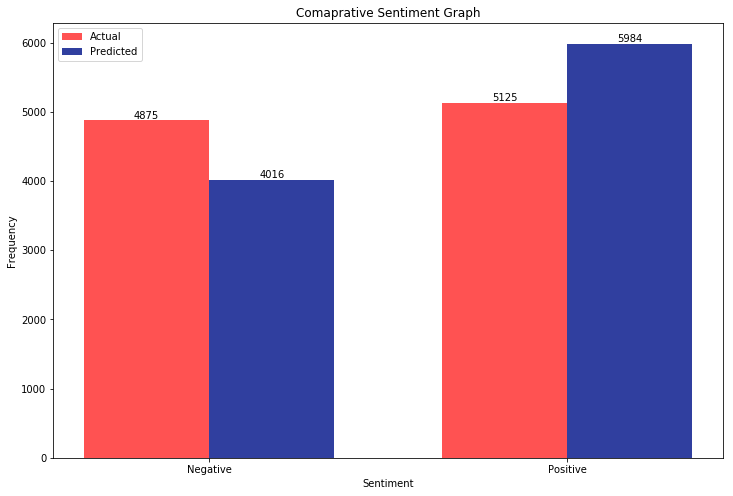

In [44]:
ind = np.arange(2)  # the x locations for the groups
width = 0.35       # the width of the bars
actual  = (n_reviews_actual, p_reviews_actual)
plt.figure(figsize = (12, 8))
fig, ax = plt.subplots(figsize = (12, 8))
rects1 = ax.bar(ind, actual, width, color='#FF5252')

predicted = (n_reviews_predicted, p_reviews_predicted)
rects2 = ax.bar(ind + width, predicted, width, color='#303F9F', linewidth=6)
ax.set_ylabel('Frequency')
ax.set_title('Comaprative Sentiment Graph')
ax.set_xticks(ind + width / 2)
ax.set_xticklabels(('Negative', 'Positive'))
ax.set_xlabel('Sentiment')

ax.legend((rects1[0], rects2[0]), ('Actual', 'Predicted'))


def autolabel(rects):
    """
    Attach a text label above each bar displaying its height
    """
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., 1.0*height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
plt.savefig('./Output/Working_SVC_bar_graph.png')
plt.show()

In [45]:
len(reviews_df.sentiment.astype('int64').values)

10000

[[2798 2077]
 [1218 3907]]


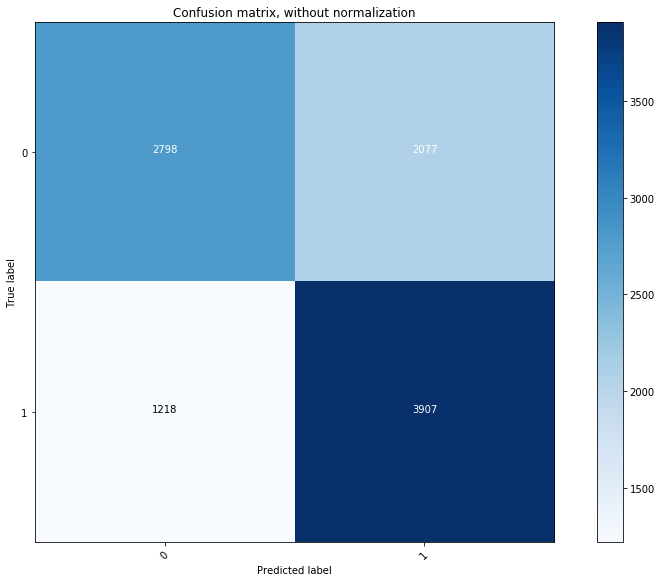

In [46]:
y_actual = list(reviews_df.sentiment.astype('int64').values)
y_pred = list(reviews_df.Predicted_Sentiment.astype('int64').values)
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    print(cm)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_actual, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(12, 8))
plot_confusion_matrix(cnf_matrix, classes=[0,1],
                      title='Confusion matrix, without normalization')
plt.savefig('./Output/Linear_SVC_Confusion_matrix.png')
plt.show()